In [1]:
import tweepy
import pandas as pd
import re
import nltk
import spacy
import pt_core_news_sm
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB


## Step 1.1

In order to train the models, I choose a [olist order review dataset from Brazil](https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce).
Considering my sentiment analysis project from twitter uses the same syntax as a olist review, I'm using it as a model training data because, personally, 
I don't know how to classify a text as positive or negative so the first dataset serve as a support for the twitter data 

In [14]:
dados = pd.read_csv("../Analise_de_sentimentos/olist_order_reviews_dataset.csv")
dados.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


# Step 1.2
droping the columns that we are not going to use  

In [3]:
dados.drop(['order_id','review_creation_date','review_answer_timestamp'],1, inplace=True)
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   review_id               99224 non-null  object
 1   review_score            99224 non-null  int64 
 2   review_comment_title    11568 non-null  object
 3   review_comment_message  40977 non-null  object
dtypes: int64(1), object(3)
memory usage: 3.0+ MB


C:\Users\guilh\AppData\Local\Temp/ipykernel_1456/2723895986.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  dados.drop(['order_id','review_creation_date','review_answer_timestamp'],1, inplace=True)


# Step 1.3
dropping duplicates 

In [4]:
duplicados = round(sum(dados.duplicated('review_id')) / len(dados) * 100, 2)
print(duplicados)

0.82


In [5]:
dados.drop_duplicates('review_id', inplace=True)

# Step 1.4
Concatenating both reviws title and review message and excluding the ones that are empty  

In [6]:
dados.fillna('', inplace = True) 
dados['review'] = dados['review_comment_title'] + ' ' + dados['review_comment_message']
dados = dados[dados['review'] != ' '] 

# Step 1.5
Creating a new column called **label** and with only 1 (positive) and 0(negative)

In [7]:
lab = []
for score in dados['review_score']:
  if score > 3:
    lab.append(1)
  else:
    lab.append(0)
dados['label'] = lab 

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


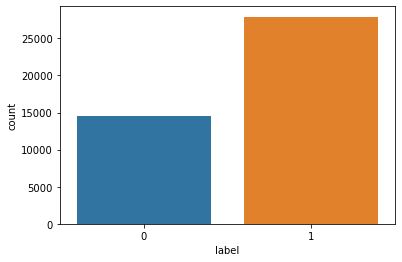

In [8]:
plt.figure(figsize=(6,4))
sns.countplot(dados['label'])
plt.show()

# Step 1.6
Since my native language is portuguese and my main focus is brazillian companies and products 

In [9]:

stwd_pt = stopwords.words("portuguese")
stwd_pt.remove('não')
stwd_pt.remove('nem')
spc_pt = pt_core_news_sm.load()

# Step 1.7
A function to clean both tweets or any strings 

In [10]:
def limpa_txt(txt):

  '''
  especifically for tweets
  '''
  txt = re.sub('@[A-Za-z0–9]+', '', txt) #removendo @
  txt = re.sub('#', '', txt) #removendo #
  txt = re.sub('RT[\s]+', '', txt) # Removendo RT
  txt = re.sub('https?:\/\/\S+', '', txt) # Removendo hyperlink
  txt = re.sub('&amp','', txt)# removendo marcação HTML de iníci
  '''
  for all cases 
  '''
  txt = txt.lower()
  txt = re.sub(r"[\W\d_]+", " ", txt)
  txt = [pal for pal in txt.split() if pal not in stwd_pt]
  spc_txt = spc_pt(" ".join(txt))
  tokens = [word.lemma_ if word.lemma_ != "-PRON-" else word.lower_ for word in spc_txt]
  
  return " ".join(tokens)

In [11]:
dados['review'] = dados['review'].apply(limpa_txt)


KeyboardInterrupt: 

# Step 1.8
Vectorizing using Bag of Words(BoW) and Tf-IDF(tfidf) 

In [ ]:
vectorizer = CountVectorizer(binary=True, max_features=5000)
txt = dados['review']
X_bow = vectorizer.fit_transform(txt)
tfidf_vect = TfidfVectorizer(max_features=5000)
X_tfidf = tfidf_vect.fit_transform(txt)


# Step 1.9
Spliting the training and testing data from both vectorized BoW and tfidf

In [ ]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X_bow, dados['label'],
                                                        test_size=0.3, random_state = 10)
X2_train, X2_test, y2_train, y2_test = train_test_split(X_tfidf, dados['label'],
                                                        test_size=0.3, random_state = 10)

In [ ]:
def mostra_metricas(y_true, y_pred):
  
  print("Accuracy: ", accuracy_score(y_true, y_pred))
  print("\nAUROC:", roc_auc_score(y_true, y_pred))
  print("\nF1-Score:", f1_score(y_true, y_pred, average='weighted'))
  print("\nConfusion Matrix:")
  sns.heatmap(confusion_matrix(y_true, y_pred), annot=True)
  plt.show()

## Logistic Regresion 

Bag of Words

Acurácia:  0.8946292364551388

AUROC: 0.8785461626265176

F1-Score: 0.8940370984409941

Matriz de confusão:


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


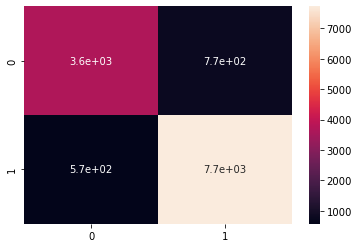

In [ ]:
reglog = LogisticRegression()
reglog.fit(X1_train, y1_train)
y1_reglog_pred = reglog.predict(X1_test)
mostra_metricas(y1_test, y1_reglog_pred)

tf-idf

Acurácia:  0.8972241880946764

AUROC: 0.8838649770919761

F1-Score: 0.8969237962847968

Matriz de confusão:


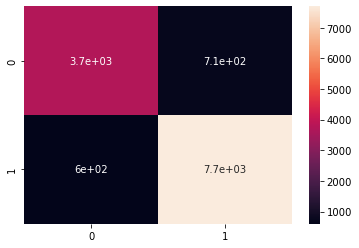

In [ ]:
reglog2 = LogisticRegression()
reglog2.fit(X2_train, y2_train)
y2_reglog_pred = reglog2.predict(X2_test)
mostra_metricas(y2_test, y2_reglog_pred)

##Random Forest

Bag of words

Acurácia:  0.892899268695447

AUROC: 0.8836163728153391

F1-Score: 0.8930768434449273

Matriz de confusão:


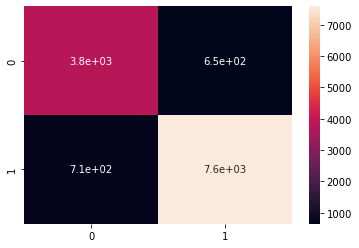

In [ ]:
rf1 = RandomForestClassifier()
rf1.fit(X1_train, y1_train)
y1_dt_pred = rf1.predict(X1_test)
mostra_metricas(y1_test, y1_dt_pred)

TF- IDF

Acurácia:  0.8931351733899504

AUROC: 0.8830042696564259

F1-Score: 0.8932218883798961

Matriz de confusão:


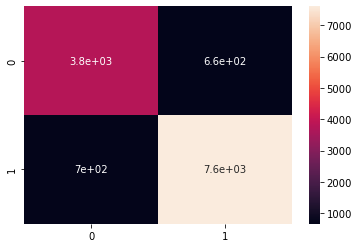

In [ ]:
rf2 = RandomForestClassifier()
rf2.fit(X2_train, y2_train)
y2_dt_pred = rf2.predict(X2_test)
mostra_metricas(y2_test, y2_dt_pred)

## Multinomial Naive Bayes 

Bag of Words

Acurácia:  0.8869230164346937

AUROC: 0.8769220270969664

F1-Score: 0.8870990030688145

Matriz de confusão:


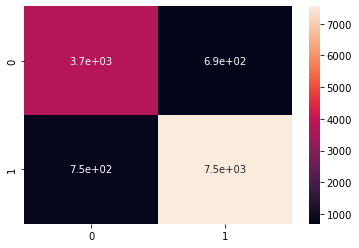

In [ ]:
nb1 = MultinomialNB()
nb1.fit(X1_train.toarray(), y1_train)
y1_gnb_pred = nb1.predict(X1_test.toarray())
mostra_metricas(y1_test, y1_gnb_pred)

tf-idf

Acurácia:  0.8873161909255327

AUROC: 0.8759547145918195

F1-Score: 0.8873369930002626

Matriz de confusão:


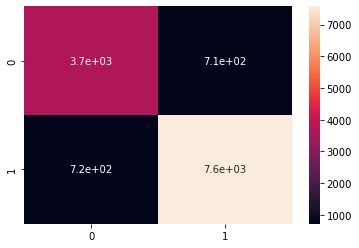

In [ ]:
nb2 = MultinomialNB()
nb2.fit(X2_train.toarray(), y2_train)
y2_gnb_pred = nb2.predict(X2_test.toarray())
mostra_metricas(y2_test, y2_gnb_pred)

# Step 1.10
Creanting the predictor using the logistic regression due to the better accuracy and f1- score 

In [ ]:
def predict_txt(txt):
  
  texto_vetorizado = tfidf_vect.transform([txt])
  pred = reglog2.predict(texto_vetorizado)

  if pred == 0:
    return 0
  else:
    return 1

1

## Step 2.1 

Using your own keys from twitter developer account  

In [ ]:
consumerKey = 'consumerKey'
consumerSecret = 'ConsumerSecret'
accessToken = 'accesToken'
accessTokenSecret = 'accessTokenSecret'
auth = tweepy.OAuthHandler(consumerKey,consumerSecret)
auth.set_access_token(accessToken, accessTokenSecret) 
api = tweepy.API(auth)

# Step 2.2

Here you put your product/company name and the language 

In [ ]:
pesquisa = 'Produto' + '-filter:retweets'
idioma = 'pt'

# Step 2.3 

Here we are using only to know the keys from _json

In [ ]:
cursor = tweepy.Cursor(api.search_tweets ,q = pesquisa ).items(1)
for tweet in cursor:
    print(tweet.text)

@TheRadioativo @elonmusk "A liberdade de expressão é a base de uma democracia em funcionamento, e o Twitter é a pra… https://t.co/TFrOXfkVGj
@viderotulo Baixar conteúdo por torrent e comprar produto pirata é um direito universal de todo cidadão
@Pk_Khalifa19 Comprei um negócio errado, queria trocar o mesmo produto porém por um tamanho menor e não tem ! Tem n… https://t.co/GlytPRkO8Q
@pontofrio 10 dias e nada do produto chegar ?
Nossa eu estou com um problema com a americanas e o parceiro de quem comprei, recebi o produto quebrado, eles não m… https://t.co/autaFTvn4H
amo muito ler caixa de cigarro, “você morre” “esse produto causa câncer” “pare de fumar”
@TheRadioativo @elonmusk "A liberdade de expressão é a base de uma democracia em funcionamento, e o Twitter é a pra… https://t.co/qXdwKp927z
O cabelo de milhões da gata lavado com produto de cachorro fazendo sucesso no Instagram
@_mynameisenvy Sim e não
Cinema de autor fazia dinheiros sérios nos anos 70/80, quando os verdadeiros artista

In [ ]:
tkeys = tweet._json.keys()
tkeys

dict_keys(['created_at', 'id', 'id_str', 'text', 'truncated', 'entities', 'metadata', 'source', 'in_reply_to_status_id', 'in_reply_to_status_id_str', 'in_reply_to_user_id', 'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place', 'contributors', 'is_quote_status', 'retweet_count', 'favorite_count', 'favorited', 'retweeted', 'possibly_sensitive', 'lang'])

In [ ]:
ttdic = {}
ttdic = ttdic.fromkeys(tkeys)
ttdic

{'created_at': None,
 'id': None,
 'id_str': None,
 'text': None,
 'truncated': None,
 'entities': None,
 'metadata': None,
 'source': None,
 'in_reply_to_status_id': None,
 'in_reply_to_status_id_str': None,
 'in_reply_to_user_id': None,
 'in_reply_to_user_id_str': None,
 'in_reply_to_screen_name': None,
 'user': None,
 'geo': None,
 'coordinates': None,
 'place': None,
 'contributors': None,
 'is_quote_status': None,
 'retweet_count': None,
 'favorite_count': None,
 'favorited': None,
 'retweeted': None,
 'possibly_sensitive': None,
 'lang': None}

# Step 2.4

Now we are using the real one to use as a dataframe

In [ ]:

cursor = tweepy.Cursor(api.search_tweets ,q = pesquisa ).items(100)

In [ ]:
for tweet in cursor:
    for key in ttdic.keys():
        try:
            tkeys = tweet._json[key]
            ttdic[key].append(tkeys)
        except KeyError:
            tkeys = ""
            ttdic[key].append("")
        except:
            ttdic[key] = [tkeys]
        print("ttdic[key]: {} - tweet[key]: {}".format(ttdic[key],tkeys))

ttdic[key]: ['Mon Apr 25 20:41:05 +0000 2022'] - tweet[key]: Mon Apr 25 20:41:05 +0000 2022
ttdic[key]: [1518691589786202112] - tweet[key]: 1518691589786202112
ttdic[key]: ['1518691589786202112'] - tweet[key]: 1518691589786202112
ttdic[key]: ['É possível comprar qualquer produto no https://t.co/mhDGh184Ch com cupom FALLEN e ter 20% de desconto.\n\nValeu CIMED… https://t.co/hIgJYE4G0l'] - tweet[key]: É possível comprar qualquer produto no https://t.co/mhDGh184Ch com cupom FALLEN e ter 20% de desconto.

Valeu CIMED… https://t.co/hIgJYE4G0l
ttdic[key]: [True] - tweet[key]: True
ttdic[key]: [{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/mhDGh184Ch', 'expanded_url': 'https://www.comprecimed.com.br/?utm_source=instagram&utm_medium=cpc&utm_campaign=Imperial&utm_id=IMPERIAL', 'display_url': 'comprecimed.com.br/?utm_source=in…', 'indices': [39, 62]}, {'url': 'https://t.co/hIgJYE4G0l', 'expanded_url': 'https://twitter.com/i/web/status/1518691589786202112', '

# Step 2.5

Since we use a dictionary, we are going to transform that in a DataFrame

In [ ]:
tt_data = pd.DataFrame.from_dict(ttdic)
tt_data.head()

,created_at,id,id_str,text,truncated,entities,metadata,source,in_reply_to_status_id,in_reply_to_status_id_str,...,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang
0,Mon Apr 25 20:41:05 +0000 2022,1518691589786202112,1518691589786202112,É possível comprar qualquer produto no https:/...,True,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",1.518692e+18,1518691587802341376,...,None,None,None,False,0,0,False,False,False,pt
1,Mon Apr 25 20:40:53 +0000 2022,1518691539853234176,1518691539853234176,eu sou viciada em comprar na shopee 😔\njuntar ...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,None,False,0,0,False,False,,pt
2,Mon Apr 25 20:40:30 +0000 2022,1518691441148575745,1518691441148575745,Galera do nordeste olha que legal\nhttps://t.c...,False,"{'hashtags': [{'text': 'XboxSeriesX', 'indices...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,None,False,0,0,False,False,False,pt
3,Mon Apr 25 20:40:28 +0000 2022,1518691432437014530,1518691432437014530,"Caro cliente, quando vc receber a mercadoria, ...",False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,None,None,None,False,0,0,False,False,,pt
4,Mon Apr 25 20:40:18 +0000 2022,1518691390754013186,1518691390754013186,alguém me indica um produto que REALMENTE tire...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,None,False,0,0,False,False,,pt


# Step 2.6

We only want data that are written in the language previously selected on step 2.2. Also, we are applying the cleaning text function 

In [ ]:
tt_data = tt_data[tt_data['lang'] == idioma]
tt_data['text'] = tt_data['text'].apply(limpa_txt)
tt_data.head()

,created_at,id,id_str,text,truncated,entities,metadata,source,in_reply_to_status_id,in_reply_to_status_id_str,...,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang
0,Mon Apr 25 20:41:05 +0000 2022,1518691589786202112,1518691589786202112,possível comprar qualquer produto cupom fallen...,True,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",1.518692e+18,1518691587802341376,...,None,None,None,False,0,0,False,False,False,pt
1,Mon Apr 25 20:40:53 +0000 2022,1518691539853234176,1518691539853234176,viciar comprar shopee juntar moeda dar comprar...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,None,False,0,0,False,False,,pt
2,Mon Apr 25 20:40:30 +0000 2022,1518691441148575745,1518691441148575745,galera nordeste olhar legal xboxseriesx dispon...,False,"{'hashtags': [{'text': 'XboxSeriesX', 'indices...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,None,False,0,0,False,False,False,pt
3,Mon Apr 25 20:40:28 +0000 2022,1518691432437014530,1518691432437014530,caro cliente vc receber mercadoria fazer favor...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,None,None,None,False,0,0,False,False,,pt
4,Mon Apr 25 20:40:18 +0000 2022,1518691390754013186,1518691390754013186,alguém indicar produto realmente tirar espinha...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,None,False,0,0,False,False,,pt


# Step 2.7

Applying the prediction function

In [ ]:
tt_data['feeling'] = tt_data['text'].apply(predict_txt)
tt_data.head()

,created_at,id,id_str,text,truncated,entities,metadata,source,in_reply_to_status_id,in_reply_to_status_id_str,...,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,lang,feeling
0,Mon Apr 25 20:41:05 +0000 2022,1518691589786202112,1518691589786202112,possível comprar qualquer produto cupom fallen...,True,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",1.518692e+18,1518691587802341376,...,None,None,False,0,0,False,False,False,pt,0
1,Mon Apr 25 20:40:53 +0000 2022,1518691539853234176,1518691539853234176,viciar comprar shopee juntar moeda dar comprar...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,False,0,0,False,False,,pt,1
2,Mon Apr 25 20:40:30 +0000 2022,1518691441148575745,1518691441148575745,galera nordeste olhar legal xboxseriesx dispon...,False,"{'hashtags': [{'text': 'XboxSeriesX', 'indices...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,False,0,0,False,False,False,pt,1
3,Mon Apr 25 20:40:28 +0000 2022,1518691432437014530,1518691432437014530,caro cliente vc receber mercadoria fazer favor...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,None,None,False,0,0,False,False,,pt,0
4,Mon Apr 25 20:40:18 +0000 2022,1518691390754013186,1518691390754013186,alguém indicar produto realmente tirar espinha...,False,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'pt', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,None,None,False,0,0,False,False,,pt,1


# Step 2.8

Getting an overall idea about de product/company perfonmance on twitter 

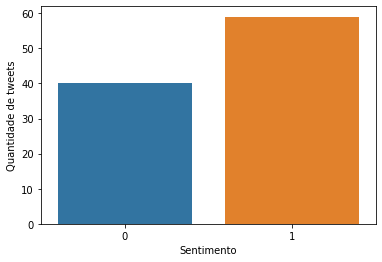

In [ ]:
df = pd.DataFrame(tt_data['feeling'].value_counts())

plt.figure()
ax = sns.barplot(x=df.index, y=df['feeling'],data=tt_data,label='Quantidade de Tweets')
ax.set_ylabel('Quantidade de tweets')
ax.set_xlabel('Sentimento');